## Preprocessing Code

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import tqdm
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt


### Dataset 1


In [189]:
df1 = pd.read_csv('/Users/orentevet/Downloads/adult.csv')
df1.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [208]:
len(df1.columns)

12

In [190]:
len(df1)

32561

In [192]:
len(df1)

32561

In [193]:
df1.drop(columns=['fnlwgt', 'relationship', 'capital.gain'], inplace=True)

In [194]:
df1['sex'] = df1['sex'].map({'Male': 1, 'Female': 0})

In [195]:
df1['sex'].nunique()

2

In [197]:
df1 = df1.replace("?", np.nan)
#df1.dropna()

In [198]:
df1['income'] = df1['income'].map({'>50K': 1, '<=50K': 0})

In [200]:
df1.isnull().sum()

age                  0
workclass         1836
education            0
education.num        0
marital.status       0
occupation        1843
race                 0
sex                  0
capital.loss         0
hours.per.week       0
native.country     583
income               0
dtype: int64

In [201]:
df1 = df1.dropna()

In [205]:
profile = ProfileReport(df1, title="Pandas Profiling Report")
profile

In [203]:
len(df1)

30162

In [137]:
df1.select_dtypes('object').columns.to_list()

['workclass',
 'education',
 'marital.status',
 'occupation',
 'race',
 'native.country']

In [138]:
ds1_dummies = pd.get_dummies(df1, columns=df1.select_dtypes('object').columns.to_list())

In [211]:
ds1_dummies.head()

,age,education.num,sex,capital.loss,hours.per.week,income,workclass_Federal-gov,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,...,native.country_Portugal,native.country_Puerto-Rico,native.country_Scotland,native.country_South,native.country_Taiwan,native.country_Thailand,native.country_Trinadad&Tobago,native.country_United-States,native.country_Vietnam,native.country_Yugoslavia
1,82,9,0,4356,18,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,54,4,0,3900,40,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
4,41,10,0,3900,40,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
5,34,9,0,3770,45,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
6,38,6,1,3770,40,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


In [212]:
len(ds1_dummies.)

30162

In [140]:
ds1_dummies.income = ds1_dummies.income.astype('int8')

In [143]:
ds1_dummies.dtypes

age                               int64
education.num                     int64
sex                               int64
capital.loss                      int64
hours.per.week                    int64
                                  ...  
native.country_Thailand           uint8
native.country_Trinadad&Tobago    uint8
native.country_United-States      uint8
native.country_Vietnam            uint8
native.country_Yugoslavia         uint8
Length: 96, dtype: object

In [144]:
#profile = ProfileReport(df1, title="Pandas Profiling Report")
#profile

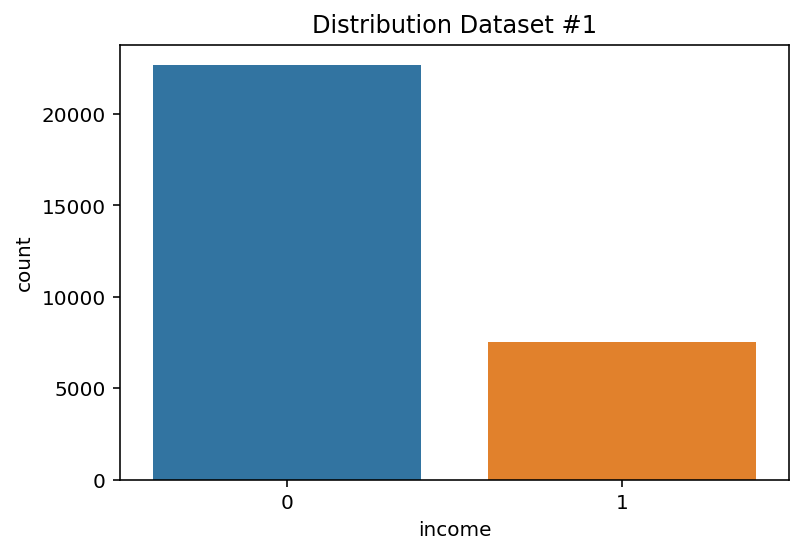

In [151]:
ax = sns.countplot(x="income", data=df1).set_title(
    "Distribution Dataset #1")

In [146]:
#df1 = df1.apply(lambda x: x.fillna(x.mean()),axis=0)

In [147]:
#df1.isnull().sum().sum()

In [148]:
y1 = ds1_dummies['income']
X1 = ds1_dummies.drop(columns='income')

In [149]:
y1.to_pickle('y1.pkl')
X1.to_pickle('X1.pkl')

### Dataset 2

In [160]:
df2 = pd.read_csv('/Users/orentevet/Downloads/Customer Churn.csv')
df2.head()

,Call Failure,Complains,Subscription Length,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,FN,FP,Churn
0,8,0,38,0,4370,71,5,17,3,1,1,30,197.640,177.8760,69.7640,0
1,0,0,39,0,318,5,7,4,2,1,2,25,46.035,41.4315,60.0000,0
2,10,0,37,0,2453,60,359,24,3,1,1,30,1536.520,1382.8680,203.6520,0
3,10,0,38,0,4198,66,1,35,1,1,1,15,240.020,216.0180,74.0020,0
4,3,0,38,0,2393,58,2,33,1,1,1,15,145.805,131.2245,64.5805,0


In [161]:
df2['Churn'].value_counts()

0    2655
1     495
Name: Churn, dtype: int64

In [162]:
len(df2)

3150

In [163]:
df2.isnull().sum()

Call  Failure              0
Complains                  0
Subscription  Length       0
Charge  Amount             0
Seconds of Use             0
Frequency of use           0
Frequency of SMS           0
Distinct Called Numbers    0
Age Group                  0
Tariff Plan                0
Status                     0
Age                        0
Customer Value             0
FN                         0
FP                         0
Churn                      0
dtype: int64

In [291]:
profile = ProfileReport(df2, title="Pandas Profiling Report")
profile

In [164]:
y2 = df2['Churn']
X2 = df2.drop(columns=['Churn', 'FN', 'FP'])

In [166]:
X2.head()

,Call Failure,Complains,Subscription Length,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value
0,8,0,38,0,4370,71,5,17,3,1,1,30,197.640
1,0,0,39,0,318,5,7,4,2,1,2,25,46.035
2,10,0,37,0,2453,60,359,24,3,1,1,30,1536.520
3,10,0,38,0,4198,66,1,35,1,1,1,15,240.020
4,3,0,38,0,2393,58,2,33,1,1,1,15,145.805


In [167]:
y2.to_pickle('y2.pkl')
X2.to_pickle('X2.pkl')

/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/orentevet/.pyenv/versions/3.8.0/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


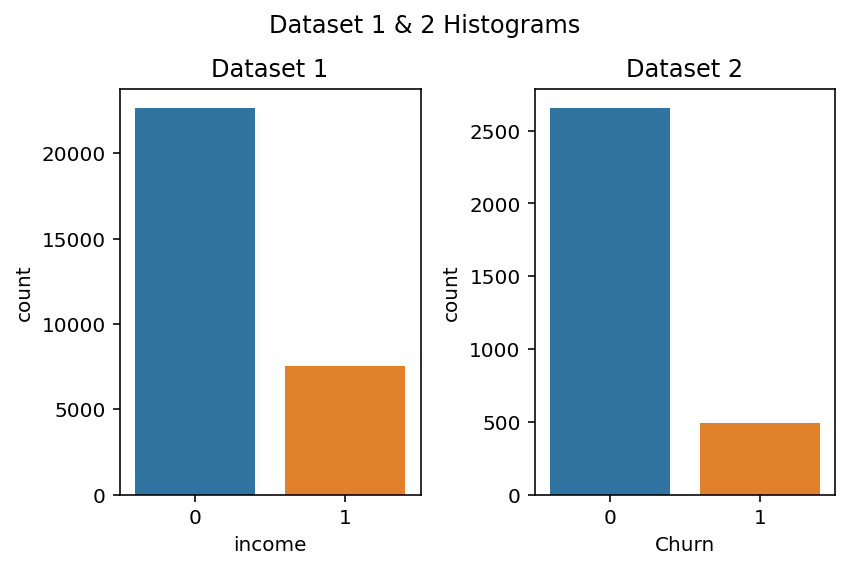

In [290]:

fig, ax = plt.subplots(1,2)


sns.countplot(df1['income'], ax=ax[0])
ax[0].set_title('Dataset 1')


sns.countplot(df2['Churn'], ax=ax[1])
ax[1].set_title('Dataset 2')

plt.suptitle('Dataset 1 & 2 Histograms')

plt.tight_layout()
plt.subplots_adjust(top=0.85)

plt.show()


In [214]:
df2['Churn'].value_counts()

0    2655
1     495
Name: Churn, dtype: int64